# Importing Necessary Modules

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
from pandas import Series,DataFrame
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import plotly.express as px
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

In [2]:
pip install plotly 

Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: six in c:\users\arjun\appdata\local\programs\python\python38-32\lib\site-packages (from plotly) (1.15.0)



# Functions used later in the program

In [2]:
def dis_scatter(x,y):
    fig = px.scatter_matrix(x,dimensions=y,color=x["Rating_Labels"])
    fig.update_traces(diagonal_visible=False)
    fig.show()

# Reading The file and describing the Data

In [3]:
data=pd.read_csv("epi_r.csv")

In [4]:
data.describe()

,rating,calories,protein,fat,sodium,#cakeweek,#wasteless,22-minute meals,3-ingredient recipes,30 days of groceries,...,yellow squash,yogurt,yonkers,yuca,zucchini,cookbooks,leftovers,snack,snack week,turkey
count,20052.000000,1.593500e+04,15890.000000,1.586900e+04,1.593300e+04,20052.000000,20052.000000,20052.000000,20052.000000,20052.000000,...,20052.000000,20052.000000,20052.000000,20052.000000,20052.000000,20052.000000,20052.000000,20052.000000,20052.000000,20052.000000
mean,3.714467,6.322958e+03,100.160793,3.468775e+02,6.225975e+03,0.000299,0.000050,0.000848,0.001346,0.000349,...,0.001247,0.026332,0.000050,0.000299,0.014861,0.000150,0.000349,0.001396,0.000948,0.022741
std,1.340829,3.590460e+05,3840.318527,2.045611e+04,3.333182e+05,0.017296,0.007062,0.029105,0.036671,0.018681,...,0.035288,0.160123,0.007062,0.017296,0.121001,0.012231,0.018681,0.037343,0.030768,0.149080
min,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.750000,1.980000e+02,3.000000,7.000000e+00,8.000000e+01,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,4.375000,3.310000e+02,8.000000,1.700000e+01,2.940000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,4.375000,5.860000e+02,27.000000,3.300000e+01,7.110000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,5.000000,3.011122e+07,236489.000000,1.722763e+06,2.767511e+07,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# Finding Duplicates and Removing them

In [5]:
no_of_duplicates=data.duplicated().sum()
print("Number of dupliacte records in the dataset are {}".format(no_of_duplicates))
data.drop_duplicates(inplace=True)
no_of_duplicates=data.duplicated().sum()
print("Number of duplicate records in the dataset after removing duplicates are {}".format(no_of_duplicates))

Number of dupliacte records in the dataset are 1801
Number of duplicate records in the dataset after removing duplicates are 0


In [6]:
data.shape

(18251, 680)

# Dropping Unwanted Columns and seperating columns

In [7]:
data=data.drop("title",axis=1)

In [8]:
unique_count=DataFrame(data.nunique())
unique_count

,0
rating,8
calories,1858
protein,282
fat,326
sodium,2434
...,...
cookbooks,2
leftovers,2
snack,2
snack week,2


In [9]:
cols=list(data.columns)
continuos_columns=unique_count[unique_count[0]>2]
categorical_columns=unique_count[unique_count[0]==2]
continuos_columns=list(continuos_columns.to_dict()[0].keys())
categorical_columns=list(categorical_columns.to_dict()[0].keys())

In [10]:
categorical_columns=list(Series(categorical_columns).unique())

# Adding Necessary Columns

In [11]:
ratings=list(data['rating'])
rating_labels=list()
for i in ratings:
    if(0<=i<=1):
        rating_labels.append("Very Bad")
    elif(1<i<=2):
        rating_labels.append("Bad")
    elif(2<i<=3):
        rating_labels.append("Average")
    elif(3<i<=4):
        rating_labels.append("Good")
    elif(4<i<=5):
        rating_labels.append("Excellent")
print(len(rating_labels))
data["Rating_Labels"]=list(Series(rating_labels))
cols.append("Rating_Labels")
categorical_columns.append("Rating_Labels")

18251


In [12]:
data.head()

,rating,calories,protein,fat,sodium,#cakeweek,#wasteless,22-minute meals,3-ingredient recipes,30 days of groceries,...,yogurt,yonkers,yuca,zucchini,cookbooks,leftovers,snack,snack week,turkey,Rating_Labels
0,2.500,426.0,30.0,7.0,559.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Average
1,4.375,403.0,18.0,23.0,1439.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent
2,3.750,165.0,6.0,7.0,165.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good
3,5.000,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent
4,3.125,547.0,20.0,32.0,452.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good


# Finding And Replacing Null Values

In [13]:
nullvals={}
greater_than_zero_null={} #placing Those columns having greater than 0 Null vals into a seperate dictionary
for i in range(len(cols)):
    temp=(data[cols[i]].isnull().sum())
    nullvals[cols[i]]=temp
    if(temp>0):
        greater_than_zero_null[cols[i]]=temp


In [14]:
greater_than_zero_null

{'calories': 3749, 'protein': 3781, 'fat': 3801, 'sodium': 3750}

Text(0.5, 1.0, 'Missing Values')

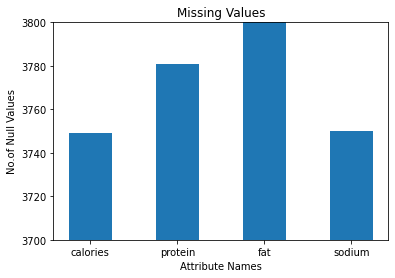

In [15]:
k1=list(greater_than_zero_null.keys())
v1=list(greater_than_zero_null.values())
plt.bar(k1,v1,width=0.5)
plt.ylim(min(v1).round(-2),max(v1).round(-2))
plt.xlabel("Attribute Names")
plt.ylabel("No.of Null Values")
plt.title("Missing Values")

# Filling Null values in Continuous Data

In [16]:
data=data.interpolate()

In [17]:
for i in range(len(cols)):
    temp=(data[cols[i]].isnull().sum())
    print("Column name is {} and number or null values are {}".format(cols[i],temp))
   

Column name is rating and number or null values are 0
Column name is calories and number or null values are 0
Column name is protein and number or null values are 0
Column name is fat and number or null values are 0
Column name is sodium and number or null values are 0
Column name is #cakeweek and number or null values are 0
Column name is #wasteless and number or null values are 0
Column name is 22-minute meals and number or null values are 0
Column name is 3-ingredient recipes and number or null values are 0
Column name is 30 days of groceries and number or null values are 0
Column name is advance prep required and number or null values are 0
Column name is alabama and number or null values are 0
Column name is alaska and number or null values are 0
Column name is alcoholic and number or null values are 0
Column name is almond and number or null values are 0
Column name is amaretto and number or null values are 0
Column name is anchovy and number or null values are 0
Column name is a

Column name is coriander and number or null values are 0
Column name is corn and number or null values are 0
Column name is cornmeal and number or null values are 0
Column name is costa mesa and number or null values are 0
Column name is cottage cheese and number or null values are 0
Column name is couscous and number or null values are 0
Column name is crab and number or null values are 0
Column name is cranberry and number or null values are 0
Column name is cranberry sauce and number or null values are 0
Column name is cream cheese and number or null values are 0
Column name is créme de cacao and number or null values are 0
Column name is crêpe and number or null values are 0
Column name is cr��me de cacao and number or null values are 0
Column name is cuba and number or null values are 0
Column name is cucumber and number or null values are 0
Column name is cumin and number or null values are 0
Column name is cupcake and number or null values are 0
Column name is currant and number

Column name is lychee and number or null values are 0
Column name is macadamia nut and number or null values are 0
Column name is macaroni and cheese and number or null values are 0
Column name is maine and number or null values are 0
Column name is mandoline and number or null values are 0
Column name is mango and number or null values are 0
Column name is maple syrup and number or null values are 0
Column name is mardi gras and number or null values are 0
Column name is margarita and number or null values are 0
Column name is marinade and number or null values are 0
Column name is marinate and number or null values are 0
Column name is marsala and number or null values are 0
Column name is marscarpone and number or null values are 0
Column name is marshmallow and number or null values are 0
Column name is martini and number or null values are 0
Column name is maryland and number or null values are 0
Column name is massachusetts and number or null values are 0
Column name is mayonnais

Column name is smoothie and number or null values are 0
Column name is snapper and number or null values are 0
Column name is sorbet and number or null values are 0
Column name is soufflé/meringue and number or null values are 0
Column name is soup/stew and number or null values are 0
Column name is sour cream and number or null values are 0
Column name is sourdough and number or null values are 0
Column name is south carolina and number or null values are 0
Column name is soy and number or null values are 0
Column name is soy free and number or null values are 0
Column name is soy sauce and number or null values are 0
Column name is spain and number or null values are 0
Column name is sparkling wine and number or null values are 0
Column name is spice and number or null values are 0
Column name is spinach and number or null values are 0
Column name is spirit and number or null values are 0
Column name is spring and number or null values are 0
Column name is spritzer and number or null

In [18]:
data

,rating,calories,protein,fat,sodium,#cakeweek,#wasteless,22-minute meals,3-ingredient recipes,30 days of groceries,...,yogurt,yonkers,yuca,zucchini,cookbooks,leftovers,snack,snack week,turkey,Rating_Labels
0,2.500,426.0,30.0,7.0,559.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Average
1,4.375,403.0,18.0,23.0,1439.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent
2,3.750,165.0,6.0,7.0,165.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good
3,5.000,356.0,13.0,19.5,308.5,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent
4,3.125,547.0,20.0,32.0,452.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20047,3.125,28.0,2.0,2.0,64.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good
20048,4.375,671.0,22.0,28.0,583.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent
20049,4.375,563.0,31.0,38.0,652.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Excellent
20050,4.375,631.0,45.0,24.0,517.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent


# Removing Outliers in each column

In [19]:
data

,rating,calories,protein,fat,sodium,#cakeweek,#wasteless,22-minute meals,3-ingredient recipes,30 days of groceries,...,yogurt,yonkers,yuca,zucchini,cookbooks,leftovers,snack,snack week,turkey,Rating_Labels
0,2.500,426.0,30.0,7.0,559.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Average
1,4.375,403.0,18.0,23.0,1439.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent
2,3.750,165.0,6.0,7.0,165.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good
3,5.000,356.0,13.0,19.5,308.5,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent
4,3.125,547.0,20.0,32.0,452.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20047,3.125,28.0,2.0,2.0,64.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good
20048,4.375,671.0,22.0,28.0,583.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent
20049,4.375,563.0,31.0,38.0,652.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Excellent
20050,4.375,631.0,45.0,24.0,517.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent


In [20]:
temp_dict={}
data_after_out=data
con_cols=continuos_columns[1:]
for i in con_cols:
    q1=data_after_out[i].describe()['25%']
    q3=data_after_out[i].describe()['75%']
    iqr=q3-q1
    temp_dict[i]=[q1,q3,iqr]


In [21]:
for i in list(temp_dict.keys()):
    q1=temp_dict[i][0]
    q3=temp_dict[i][1]
    iqr=temp_dict[i][2]
    data_after_out=data_after_out[(q1-1.5*iqr)<=data_after_out[i]]
    data_after_out=data_after_out[data_after_out[i]<=q3+1.5*iqr]
    print("Length after each outlier is removed from columns is",len(data_after_out))

Length after each outlier is removed from columns is 17102
Length after each outlier is removed from columns is 16588
Length after each outlier is removed from columns is 16333
Length after each outlier is removed from columns is 15689


In [22]:
print("Number of outliers is {} ".format(len(data)-len(data_after_out)))

Number of outliers is 2562 


# Data after Removing outliers

In [23]:
data_after_out

,rating,calories,protein,fat,sodium,#cakeweek,#wasteless,22-minute meals,3-ingredient recipes,30 days of groceries,...,yogurt,yonkers,yuca,zucchini,cookbooks,leftovers,snack,snack week,turkey,Rating_Labels
0,2.500,426.0,30.0,7.0,559.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Average
1,4.375,403.0,18.0,23.0,1439.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent
2,3.750,165.0,6.0,7.0,165.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good
3,5.000,356.0,13.0,19.5,308.5,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent
4,3.125,547.0,20.0,32.0,452.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20044,3.750,84.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good
20047,3.125,28.0,2.0,2.0,64.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Good
20048,4.375,671.0,22.0,28.0,583.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Excellent
20049,4.375,563.0,31.0,38.0,652.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Excellent


In [24]:
data_after_out.describe()

,rating,calories,protein,fat,sodium,#cakeweek,#wasteless,22-minute meals,3-ingredient recipes,30 days of groceries,...,yellow squash,yogurt,yonkers,yuca,zucchini,cookbooks,leftovers,snack,snack week,turkey
count,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000,...,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000,15689.000000
mean,3.690723,363.851338,13.542774,19.547628,381.401633,0.000255,0.000064,0.000637,0.001466,0.000255,...,0.001530,0.028173,0.000064,0.000319,0.016253,0.000127,0.000382,0.001657,0.001084,0.015998
std,1.349990,217.076482,14.043926,15.352425,374.651559,0.015966,0.007984,0.025239,0.038261,0.015966,...,0.039083,0.165471,0.007984,0.017850,0.126453,0.011290,0.019553,0.040676,0.032901,0.125473
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.750000,202.000000,3.000000,8.000000,84.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,4.375000,315.500000,8.000000,16.000000,260.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,4.375000,496.500000,20.000000,28.000000,574.500000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,5.000000,1168.000000,64.000000,71.333333,1682.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [25]:
dis_scatter(data_after_out,con_cols)

# Finding Correlation between Cotinuous Variables

In [26]:
correlations=data_after_out[con_cols].corr()

<AxesSubplot:>

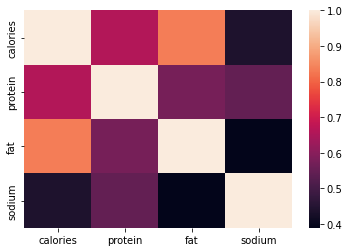

In [27]:
sns.heatmap(correlations)

In [29]:
correlations

,calories,protein,fat,sodium
calories,1.000000,0.656935,0.835042,0.437157
protein,0.656935,1.000000,0.573694,0.545664
fat,0.835042,0.573694,1.000000,0.389348
sodium,0.437157,0.545664,0.389348,1.000000


# Standarizing values

In [30]:
x=data_after_out[con_cols]
x=DataFrame(StandardScaler().fit_transform(x),columns=con_cols)
x["Rating_Labels"]=Series(list(data_after_out["Rating_Labels"]))
x.describe()

,calories,protein,fat,sodium
count,1.568900e+04,1.568900e+04,1.568900e+04,1.568900e+04
mean,-1.014479e-16,-2.898511e-17,1.811569e-18,5.615865e-17
std,1.000032e+00,1.000032e+00,1.000032e+00,1.000032e+00
min,-1.676197e+00,-9.643462e-01,-1.273301e+00,-1.018049e+00
25%,-7.456197e-01,-7.507239e-01,-7.521936e-01,-7.938339e-01
50%,-2.227458e-01,-3.946867e-01,-2.310867e-01,-3.240491e-01
75%,6.110883e-01,4.598025e-01,5.505737e-01,5.154243e-01
max,3.704567e+00,3.592929e+00,3.373236e+00,3.471599e+00


In [31]:
dis_scatter(x,con_cols)

# Principal Component Analysis

In [32]:
pca=PCA(n_components=3)

In [33]:
principalComponents = pca.fit_transform(x[list(x.columns)[:-1]])

In [34]:
x1=DataFrame(principalComponents,columns=['PCA_1','PCA_2','PCA_3'])
x1.describe()

,PCA_1,PCA_2,PCA_3
count,1.568900e+04,1.568900e+04,1.568900e+04
mean,-2.536197e-17,-2.445618e-17,-5.525286e-17
std,1.655351e+00,8.477410e-01,6.207005e-01
min,-2.491225e+00,-3.157244e+00,-3.200147e+00
25%,-1.297447e+00,-4.604791e-01,-3.318955e-01
50%,-3.649234e-01,-6.780452e-02,5.023495e-03
75%,1.053346e+00,3.850702e-01,2.394431e-01
max,6.527081e+00,3.775894e+00,3.874414e+00


In [35]:
list_sum_of_cat=[]
for i in range(len(x)):
    temp=data_after_out[categorical_columns[:-1]].iloc[i].sum()
    list_sum_of_cat.append(temp)
    print("iteration: ",i)

iteration:  0
iteration:  1
iteration:  2
iteration:  3
iteration:  4
iteration:  5
iteration:  6
iteration:  7
iteration:  8
iteration:  9
iteration:  10
iteration:  11
iteration:  12
iteration:  13
iteration:  14
iteration:  15
iteration:  16
iteration:  17
iteration:  18
iteration:  19
iteration:  20
iteration:  21
iteration:  22
iteration:  23
iteration:  24
iteration:  25
iteration:  26
iteration:  27
iteration:  28
iteration:  29
iteration:  30
iteration:  31
iteration:  32
iteration:  33
iteration:  34
iteration:  35
iteration:  36
iteration:  37
iteration:  38
iteration:  39
iteration:  40
iteration:  41
iteration:  42
iteration:  43
iteration:  44
iteration:  45
iteration:  46
iteration:  47
iteration:  48
iteration:  49
iteration:  50
iteration:  51
iteration:  52
iteration:  53
iteration:  54
iteration:  55
iteration:  56
iteration:  57
iteration:  58
iteration:  59
iteration:  60
iteration:  61
iteration:  62
iteration:  63
iteration:  64
iteration:  65
iteration:  66
itera

iteration:  519
iteration:  520
iteration:  521
iteration:  522
iteration:  523
iteration:  524
iteration:  525
iteration:  526
iteration:  527
iteration:  528
iteration:  529
iteration:  530
iteration:  531
iteration:  532
iteration:  533
iteration:  534
iteration:  535
iteration:  536
iteration:  537
iteration:  538
iteration:  539
iteration:  540
iteration:  541
iteration:  542
iteration:  543
iteration:  544
iteration:  545
iteration:  546
iteration:  547
iteration:  548
iteration:  549
iteration:  550
iteration:  551
iteration:  552
iteration:  553
iteration:  554
iteration:  555
iteration:  556
iteration:  557
iteration:  558
iteration:  559
iteration:  560
iteration:  561
iteration:  562
iteration:  563
iteration:  564
iteration:  565
iteration:  566
iteration:  567
iteration:  568
iteration:  569
iteration:  570
iteration:  571
iteration:  572
iteration:  573
iteration:  574
iteration:  575
iteration:  576
iteration:  577
iteration:  578
iteration:  579
iteration:  580
iteratio

iteration:  1031
iteration:  1032
iteration:  1033
iteration:  1034
iteration:  1035
iteration:  1036
iteration:  1037
iteration:  1038
iteration:  1039
iteration:  1040
iteration:  1041
iteration:  1042
iteration:  1043
iteration:  1044
iteration:  1045
iteration:  1046
iteration:  1047
iteration:  1048
iteration:  1049
iteration:  1050
iteration:  1051
iteration:  1052
iteration:  1053
iteration:  1054
iteration:  1055
iteration:  1056
iteration:  1057
iteration:  1058
iteration:  1059
iteration:  1060
iteration:  1061
iteration:  1062
iteration:  1063
iteration:  1064
iteration:  1065
iteration:  1066
iteration:  1067
iteration:  1068
iteration:  1069
iteration:  1070
iteration:  1071
iteration:  1072
iteration:  1073
iteration:  1074
iteration:  1075
iteration:  1076
iteration:  1077
iteration:  1078
iteration:  1079
iteration:  1080
iteration:  1081
iteration:  1082
iteration:  1083
iteration:  1084
iteration:  1085
iteration:  1086
iteration:  1087
iteration:  1088
iteration:  10

iteration:  1515
iteration:  1516
iteration:  1517
iteration:  1518
iteration:  1519
iteration:  1520
iteration:  1521
iteration:  1522
iteration:  1523
iteration:  1524
iteration:  1525
iteration:  1526
iteration:  1527
iteration:  1528
iteration:  1529
iteration:  1530
iteration:  1531
iteration:  1532
iteration:  1533
iteration:  1534
iteration:  1535
iteration:  1536
iteration:  1537
iteration:  1538
iteration:  1539
iteration:  1540
iteration:  1541
iteration:  1542
iteration:  1543
iteration:  1544
iteration:  1545
iteration:  1546
iteration:  1547
iteration:  1548
iteration:  1549
iteration:  1550
iteration:  1551
iteration:  1552
iteration:  1553
iteration:  1554
iteration:  1555
iteration:  1556
iteration:  1557
iteration:  1558
iteration:  1559
iteration:  1560
iteration:  1561
iteration:  1562
iteration:  1563
iteration:  1564
iteration:  1565
iteration:  1566
iteration:  1567
iteration:  1568
iteration:  1569
iteration:  1570
iteration:  1571
iteration:  1572
iteration:  15

iteration:  1997
iteration:  1998
iteration:  1999
iteration:  2000
iteration:  2001
iteration:  2002
iteration:  2003
iteration:  2004
iteration:  2005
iteration:  2006
iteration:  2007
iteration:  2008
iteration:  2009
iteration:  2010
iteration:  2011
iteration:  2012
iteration:  2013
iteration:  2014
iteration:  2015
iteration:  2016
iteration:  2017
iteration:  2018
iteration:  2019
iteration:  2020
iteration:  2021
iteration:  2022
iteration:  2023
iteration:  2024
iteration:  2025
iteration:  2026
iteration:  2027
iteration:  2028
iteration:  2029
iteration:  2030
iteration:  2031
iteration:  2032
iteration:  2033
iteration:  2034
iteration:  2035
iteration:  2036
iteration:  2037
iteration:  2038
iteration:  2039
iteration:  2040
iteration:  2041
iteration:  2042
iteration:  2043
iteration:  2044
iteration:  2045
iteration:  2046
iteration:  2047
iteration:  2048
iteration:  2049
iteration:  2050
iteration:  2051
iteration:  2052
iteration:  2053
iteration:  2054
iteration:  20

iteration:  2480
iteration:  2481
iteration:  2482
iteration:  2483
iteration:  2484
iteration:  2485
iteration:  2486
iteration:  2487
iteration:  2488
iteration:  2489
iteration:  2490
iteration:  2491
iteration:  2492
iteration:  2493
iteration:  2494
iteration:  2495
iteration:  2496
iteration:  2497
iteration:  2498
iteration:  2499
iteration:  2500
iteration:  2501
iteration:  2502
iteration:  2503
iteration:  2504
iteration:  2505
iteration:  2506
iteration:  2507
iteration:  2508
iteration:  2509
iteration:  2510
iteration:  2511
iteration:  2512
iteration:  2513
iteration:  2514
iteration:  2515
iteration:  2516
iteration:  2517
iteration:  2518
iteration:  2519
iteration:  2520
iteration:  2521
iteration:  2522
iteration:  2523
iteration:  2524
iteration:  2525
iteration:  2526
iteration:  2527
iteration:  2528
iteration:  2529
iteration:  2530
iteration:  2531
iteration:  2532
iteration:  2533
iteration:  2534
iteration:  2535
iteration:  2536
iteration:  2537
iteration:  25

iteration:  2962
iteration:  2963
iteration:  2964
iteration:  2965
iteration:  2966
iteration:  2967
iteration:  2968
iteration:  2969
iteration:  2970
iteration:  2971
iteration:  2972
iteration:  2973
iteration:  2974
iteration:  2975
iteration:  2976
iteration:  2977
iteration:  2978
iteration:  2979
iteration:  2980
iteration:  2981
iteration:  2982
iteration:  2983
iteration:  2984
iteration:  2985
iteration:  2986
iteration:  2987
iteration:  2988
iteration:  2989
iteration:  2990
iteration:  2991
iteration:  2992
iteration:  2993
iteration:  2994
iteration:  2995
iteration:  2996
iteration:  2997
iteration:  2998
iteration:  2999
iteration:  3000
iteration:  3001
iteration:  3002
iteration:  3003
iteration:  3004
iteration:  3005
iteration:  3006
iteration:  3007
iteration:  3008
iteration:  3009
iteration:  3010
iteration:  3011
iteration:  3012
iteration:  3013
iteration:  3014
iteration:  3015
iteration:  3016
iteration:  3017
iteration:  3018
iteration:  3019
iteration:  30

iteration:  3445
iteration:  3446
iteration:  3447
iteration:  3448
iteration:  3449
iteration:  3450
iteration:  3451
iteration:  3452
iteration:  3453
iteration:  3454
iteration:  3455
iteration:  3456
iteration:  3457
iteration:  3458
iteration:  3459
iteration:  3460
iteration:  3461
iteration:  3462
iteration:  3463
iteration:  3464
iteration:  3465
iteration:  3466
iteration:  3467
iteration:  3468
iteration:  3469
iteration:  3470
iteration:  3471
iteration:  3472
iteration:  3473
iteration:  3474
iteration:  3475
iteration:  3476
iteration:  3477
iteration:  3478
iteration:  3479
iteration:  3480
iteration:  3481
iteration:  3482
iteration:  3483
iteration:  3484
iteration:  3485
iteration:  3486
iteration:  3487
iteration:  3488
iteration:  3489
iteration:  3490
iteration:  3491
iteration:  3492
iteration:  3493
iteration:  3494
iteration:  3495
iteration:  3496
iteration:  3497
iteration:  3498
iteration:  3499
iteration:  3500
iteration:  3501
iteration:  3502
iteration:  35

iteration:  3928
iteration:  3929
iteration:  3930
iteration:  3931
iteration:  3932
iteration:  3933
iteration:  3934
iteration:  3935
iteration:  3936
iteration:  3937
iteration:  3938
iteration:  3939
iteration:  3940
iteration:  3941
iteration:  3942
iteration:  3943
iteration:  3944
iteration:  3945
iteration:  3946
iteration:  3947
iteration:  3948
iteration:  3949
iteration:  3950
iteration:  3951
iteration:  3952
iteration:  3953
iteration:  3954
iteration:  3955
iteration:  3956
iteration:  3957
iteration:  3958
iteration:  3959
iteration:  3960
iteration:  3961
iteration:  3962
iteration:  3963
iteration:  3964
iteration:  3965
iteration:  3966
iteration:  3967
iteration:  3968
iteration:  3969
iteration:  3970
iteration:  3971
iteration:  3972
iteration:  3973
iteration:  3974
iteration:  3975
iteration:  3976
iteration:  3977
iteration:  3978
iteration:  3979
iteration:  3980
iteration:  3981
iteration:  3982
iteration:  3983
iteration:  3984
iteration:  3985
iteration:  39

iteration:  4410
iteration:  4411
iteration:  4412
iteration:  4413
iteration:  4414
iteration:  4415
iteration:  4416
iteration:  4417
iteration:  4418
iteration:  4419
iteration:  4420
iteration:  4421
iteration:  4422
iteration:  4423
iteration:  4424
iteration:  4425
iteration:  4426
iteration:  4427
iteration:  4428
iteration:  4429
iteration:  4430
iteration:  4431
iteration:  4432
iteration:  4433
iteration:  4434
iteration:  4435
iteration:  4436
iteration:  4437
iteration:  4438
iteration:  4439
iteration:  4440
iteration:  4441
iteration:  4442
iteration:  4443
iteration:  4444
iteration:  4445
iteration:  4446
iteration:  4447
iteration:  4448
iteration:  4449
iteration:  4450
iteration:  4451
iteration:  4452
iteration:  4453
iteration:  4454
iteration:  4455
iteration:  4456
iteration:  4457
iteration:  4458
iteration:  4459
iteration:  4460
iteration:  4461
iteration:  4462
iteration:  4463
iteration:  4464
iteration:  4465
iteration:  4466
iteration:  4467
iteration:  44

iteration:  4894
iteration:  4895
iteration:  4896
iteration:  4897
iteration:  4898
iteration:  4899
iteration:  4900
iteration:  4901
iteration:  4902
iteration:  4903
iteration:  4904
iteration:  4905
iteration:  4906
iteration:  4907
iteration:  4908
iteration:  4909
iteration:  4910
iteration:  4911
iteration:  4912
iteration:  4913
iteration:  4914
iteration:  4915
iteration:  4916
iteration:  4917
iteration:  4918
iteration:  4919
iteration:  4920
iteration:  4921
iteration:  4922
iteration:  4923
iteration:  4924
iteration:  4925
iteration:  4926
iteration:  4927
iteration:  4928
iteration:  4929
iteration:  4930
iteration:  4931
iteration:  4932
iteration:  4933
iteration:  4934
iteration:  4935
iteration:  4936
iteration:  4937
iteration:  4938
iteration:  4939
iteration:  4940
iteration:  4941
iteration:  4942
iteration:  4943
iteration:  4944
iteration:  4945
iteration:  4946
iteration:  4947
iteration:  4948
iteration:  4949
iteration:  4950
iteration:  4951
iteration:  49

iteration:  5376
iteration:  5377
iteration:  5378
iteration:  5379
iteration:  5380
iteration:  5381
iteration:  5382
iteration:  5383
iteration:  5384
iteration:  5385
iteration:  5386
iteration:  5387
iteration:  5388
iteration:  5389
iteration:  5390
iteration:  5391
iteration:  5392
iteration:  5393
iteration:  5394
iteration:  5395
iteration:  5396
iteration:  5397
iteration:  5398
iteration:  5399
iteration:  5400
iteration:  5401
iteration:  5402
iteration:  5403
iteration:  5404
iteration:  5405
iteration:  5406
iteration:  5407
iteration:  5408
iteration:  5409
iteration:  5410
iteration:  5411
iteration:  5412
iteration:  5413
iteration:  5414
iteration:  5415
iteration:  5416
iteration:  5417
iteration:  5418
iteration:  5419
iteration:  5420
iteration:  5421
iteration:  5422
iteration:  5423
iteration:  5424
iteration:  5425
iteration:  5426
iteration:  5427
iteration:  5428
iteration:  5429
iteration:  5430
iteration:  5431
iteration:  5432
iteration:  5433
iteration:  54

iteration:  5858
iteration:  5859
iteration:  5860
iteration:  5861
iteration:  5862
iteration:  5863
iteration:  5864
iteration:  5865
iteration:  5866
iteration:  5867
iteration:  5868
iteration:  5869
iteration:  5870
iteration:  5871
iteration:  5872
iteration:  5873
iteration:  5874
iteration:  5875
iteration:  5876
iteration:  5877
iteration:  5878
iteration:  5879
iteration:  5880
iteration:  5881
iteration:  5882
iteration:  5883
iteration:  5884
iteration:  5885
iteration:  5886
iteration:  5887
iteration:  5888
iteration:  5889
iteration:  5890
iteration:  5891
iteration:  5892
iteration:  5893
iteration:  5894
iteration:  5895
iteration:  5896
iteration:  5897
iteration:  5898
iteration:  5899
iteration:  5900
iteration:  5901
iteration:  5902
iteration:  5903
iteration:  5904
iteration:  5905
iteration:  5906
iteration:  5907
iteration:  5908
iteration:  5909
iteration:  5910
iteration:  5911
iteration:  5912
iteration:  5913
iteration:  5914
iteration:  5915
iteration:  59

iteration:  6341
iteration:  6342
iteration:  6343
iteration:  6344
iteration:  6345
iteration:  6346
iteration:  6347
iteration:  6348
iteration:  6349
iteration:  6350
iteration:  6351
iteration:  6352
iteration:  6353
iteration:  6354
iteration:  6355
iteration:  6356
iteration:  6357
iteration:  6358
iteration:  6359
iteration:  6360
iteration:  6361
iteration:  6362
iteration:  6363
iteration:  6364
iteration:  6365
iteration:  6366
iteration:  6367
iteration:  6368
iteration:  6369
iteration:  6370
iteration:  6371
iteration:  6372
iteration:  6373
iteration:  6374
iteration:  6375
iteration:  6376
iteration:  6377
iteration:  6378
iteration:  6379
iteration:  6380
iteration:  6381
iteration:  6382
iteration:  6383
iteration:  6384
iteration:  6385
iteration:  6386
iteration:  6387
iteration:  6388
iteration:  6389
iteration:  6390
iteration:  6391
iteration:  6392
iteration:  6393
iteration:  6394
iteration:  6395
iteration:  6396
iteration:  6397
iteration:  6398
iteration:  63

iteration:  6823
iteration:  6824
iteration:  6825
iteration:  6826
iteration:  6827
iteration:  6828
iteration:  6829
iteration:  6830
iteration:  6831
iteration:  6832
iteration:  6833
iteration:  6834
iteration:  6835
iteration:  6836
iteration:  6837
iteration:  6838
iteration:  6839
iteration:  6840
iteration:  6841
iteration:  6842
iteration:  6843
iteration:  6844
iteration:  6845
iteration:  6846
iteration:  6847
iteration:  6848
iteration:  6849
iteration:  6850
iteration:  6851
iteration:  6852
iteration:  6853
iteration:  6854
iteration:  6855
iteration:  6856
iteration:  6857
iteration:  6858
iteration:  6859
iteration:  6860
iteration:  6861
iteration:  6862
iteration:  6863
iteration:  6864
iteration:  6865
iteration:  6866
iteration:  6867
iteration:  6868
iteration:  6869
iteration:  6870
iteration:  6871
iteration:  6872
iteration:  6873
iteration:  6874
iteration:  6875
iteration:  6876
iteration:  6877
iteration:  6878
iteration:  6879
iteration:  6880
iteration:  68

iteration:  7305
iteration:  7306
iteration:  7307
iteration:  7308
iteration:  7309
iteration:  7310
iteration:  7311
iteration:  7312
iteration:  7313
iteration:  7314
iteration:  7315
iteration:  7316
iteration:  7317
iteration:  7318
iteration:  7319
iteration:  7320
iteration:  7321
iteration:  7322
iteration:  7323
iteration:  7324
iteration:  7325
iteration:  7326
iteration:  7327
iteration:  7328
iteration:  7329
iteration:  7330
iteration:  7331
iteration:  7332
iteration:  7333
iteration:  7334
iteration:  7335
iteration:  7336
iteration:  7337
iteration:  7338
iteration:  7339
iteration:  7340
iteration:  7341
iteration:  7342
iteration:  7343
iteration:  7344
iteration:  7345
iteration:  7346
iteration:  7347
iteration:  7348
iteration:  7349
iteration:  7350
iteration:  7351
iteration:  7352
iteration:  7353
iteration:  7354
iteration:  7355
iteration:  7356
iteration:  7357
iteration:  7358
iteration:  7359
iteration:  7360
iteration:  7361
iteration:  7362
iteration:  73

iteration:  7787
iteration:  7788
iteration:  7789
iteration:  7790
iteration:  7791
iteration:  7792
iteration:  7793
iteration:  7794
iteration:  7795
iteration:  7796
iteration:  7797
iteration:  7798
iteration:  7799
iteration:  7800
iteration:  7801
iteration:  7802
iteration:  7803
iteration:  7804
iteration:  7805
iteration:  7806
iteration:  7807
iteration:  7808
iteration:  7809
iteration:  7810
iteration:  7811
iteration:  7812
iteration:  7813
iteration:  7814
iteration:  7815
iteration:  7816
iteration:  7817
iteration:  7818
iteration:  7819
iteration:  7820
iteration:  7821
iteration:  7822
iteration:  7823
iteration:  7824
iteration:  7825
iteration:  7826
iteration:  7827
iteration:  7828
iteration:  7829
iteration:  7830
iteration:  7831
iteration:  7832
iteration:  7833
iteration:  7834
iteration:  7835
iteration:  7836
iteration:  7837
iteration:  7838
iteration:  7839
iteration:  7840
iteration:  7841
iteration:  7842
iteration:  7843
iteration:  7844
iteration:  78

iteration:  8269
iteration:  8270
iteration:  8271
iteration:  8272
iteration:  8273
iteration:  8274
iteration:  8275
iteration:  8276
iteration:  8277
iteration:  8278
iteration:  8279
iteration:  8280
iteration:  8281
iteration:  8282
iteration:  8283
iteration:  8284
iteration:  8285
iteration:  8286
iteration:  8287
iteration:  8288
iteration:  8289
iteration:  8290
iteration:  8291
iteration:  8292
iteration:  8293
iteration:  8294
iteration:  8295
iteration:  8296
iteration:  8297
iteration:  8298
iteration:  8299
iteration:  8300
iteration:  8301
iteration:  8302
iteration:  8303
iteration:  8304
iteration:  8305
iteration:  8306
iteration:  8307
iteration:  8308
iteration:  8309
iteration:  8310
iteration:  8311
iteration:  8312
iteration:  8313
iteration:  8314
iteration:  8315
iteration:  8316
iteration:  8317
iteration:  8318
iteration:  8319
iteration:  8320
iteration:  8321
iteration:  8322
iteration:  8323
iteration:  8324
iteration:  8325
iteration:  8326
iteration:  83

iteration:  8751
iteration:  8752
iteration:  8753
iteration:  8754
iteration:  8755
iteration:  8756
iteration:  8757
iteration:  8758
iteration:  8759
iteration:  8760
iteration:  8761
iteration:  8762
iteration:  8763
iteration:  8764
iteration:  8765
iteration:  8766
iteration:  8767
iteration:  8768
iteration:  8769
iteration:  8770
iteration:  8771
iteration:  8772
iteration:  8773
iteration:  8774
iteration:  8775
iteration:  8776
iteration:  8777
iteration:  8778
iteration:  8779
iteration:  8780
iteration:  8781
iteration:  8782
iteration:  8783
iteration:  8784
iteration:  8785
iteration:  8786
iteration:  8787
iteration:  8788
iteration:  8789
iteration:  8790
iteration:  8791
iteration:  8792
iteration:  8793
iteration:  8794
iteration:  8795
iteration:  8796
iteration:  8797
iteration:  8798
iteration:  8799
iteration:  8800
iteration:  8801
iteration:  8802
iteration:  8803
iteration:  8804
iteration:  8805
iteration:  8806
iteration:  8807
iteration:  8808
iteration:  88

iteration:  9234
iteration:  9235
iteration:  9236
iteration:  9237
iteration:  9238
iteration:  9239
iteration:  9240
iteration:  9241
iteration:  9242
iteration:  9243
iteration:  9244
iteration:  9245
iteration:  9246
iteration:  9247
iteration:  9248
iteration:  9249
iteration:  9250
iteration:  9251
iteration:  9252
iteration:  9253
iteration:  9254
iteration:  9255
iteration:  9256
iteration:  9257
iteration:  9258
iteration:  9259
iteration:  9260
iteration:  9261
iteration:  9262
iteration:  9263
iteration:  9264
iteration:  9265
iteration:  9266
iteration:  9267
iteration:  9268
iteration:  9269
iteration:  9270
iteration:  9271
iteration:  9272
iteration:  9273
iteration:  9274
iteration:  9275
iteration:  9276
iteration:  9277
iteration:  9278
iteration:  9279
iteration:  9280
iteration:  9281
iteration:  9282
iteration:  9283
iteration:  9284
iteration:  9285
iteration:  9286
iteration:  9287
iteration:  9288
iteration:  9289
iteration:  9290
iteration:  9291
iteration:  92

iteration:  9717
iteration:  9718
iteration:  9719
iteration:  9720
iteration:  9721
iteration:  9722
iteration:  9723
iteration:  9724
iteration:  9725
iteration:  9726
iteration:  9727
iteration:  9728
iteration:  9729
iteration:  9730
iteration:  9731
iteration:  9732
iteration:  9733
iteration:  9734
iteration:  9735
iteration:  9736
iteration:  9737
iteration:  9738
iteration:  9739
iteration:  9740
iteration:  9741
iteration:  9742
iteration:  9743
iteration:  9744
iteration:  9745
iteration:  9746
iteration:  9747
iteration:  9748
iteration:  9749
iteration:  9750
iteration:  9751
iteration:  9752
iteration:  9753
iteration:  9754
iteration:  9755
iteration:  9756
iteration:  9757
iteration:  9758
iteration:  9759
iteration:  9760
iteration:  9761
iteration:  9762
iteration:  9763
iteration:  9764
iteration:  9765
iteration:  9766
iteration:  9767
iteration:  9768
iteration:  9769
iteration:  9770
iteration:  9771
iteration:  9772
iteration:  9773
iteration:  9774
iteration:  97

iteration:  10188
iteration:  10189
iteration:  10190
iteration:  10191
iteration:  10192
iteration:  10193
iteration:  10194
iteration:  10195
iteration:  10196
iteration:  10197
iteration:  10198
iteration:  10199
iteration:  10200
iteration:  10201
iteration:  10202
iteration:  10203
iteration:  10204
iteration:  10205
iteration:  10206
iteration:  10207
iteration:  10208
iteration:  10209
iteration:  10210
iteration:  10211
iteration:  10212
iteration:  10213
iteration:  10214
iteration:  10215
iteration:  10216
iteration:  10217
iteration:  10218
iteration:  10219
iteration:  10220
iteration:  10221
iteration:  10222
iteration:  10223
iteration:  10224
iteration:  10225
iteration:  10226
iteration:  10227
iteration:  10228
iteration:  10229
iteration:  10230
iteration:  10231
iteration:  10232
iteration:  10233
iteration:  10234
iteration:  10235
iteration:  10236
iteration:  10237
iteration:  10238
iteration:  10239
iteration:  10240
iteration:  10241
iteration:  10242
iteration:

iteration:  10644
iteration:  10645
iteration:  10646
iteration:  10647
iteration:  10648
iteration:  10649
iteration:  10650
iteration:  10651
iteration:  10652
iteration:  10653
iteration:  10654
iteration:  10655
iteration:  10656
iteration:  10657
iteration:  10658
iteration:  10659
iteration:  10660
iteration:  10661
iteration:  10662
iteration:  10663
iteration:  10664
iteration:  10665
iteration:  10666
iteration:  10667
iteration:  10668
iteration:  10669
iteration:  10670
iteration:  10671
iteration:  10672
iteration:  10673
iteration:  10674
iteration:  10675
iteration:  10676
iteration:  10677
iteration:  10678
iteration:  10679
iteration:  10680
iteration:  10681
iteration:  10682
iteration:  10683
iteration:  10684
iteration:  10685
iteration:  10686
iteration:  10687
iteration:  10688
iteration:  10689
iteration:  10690
iteration:  10691
iteration:  10692
iteration:  10693
iteration:  10694
iteration:  10695
iteration:  10696
iteration:  10697
iteration:  10698
iteration:

iteration:  11100
iteration:  11101
iteration:  11102
iteration:  11103
iteration:  11104
iteration:  11105
iteration:  11106
iteration:  11107
iteration:  11108
iteration:  11109
iteration:  11110
iteration:  11111
iteration:  11112
iteration:  11113
iteration:  11114
iteration:  11115
iteration:  11116
iteration:  11117
iteration:  11118
iteration:  11119
iteration:  11120
iteration:  11121
iteration:  11122
iteration:  11123
iteration:  11124
iteration:  11125
iteration:  11126
iteration:  11127
iteration:  11128
iteration:  11129
iteration:  11130
iteration:  11131
iteration:  11132
iteration:  11133
iteration:  11134
iteration:  11135
iteration:  11136
iteration:  11137
iteration:  11138
iteration:  11139
iteration:  11140
iteration:  11141
iteration:  11142
iteration:  11143
iteration:  11144
iteration:  11145
iteration:  11146
iteration:  11147
iteration:  11148
iteration:  11149
iteration:  11150
iteration:  11151
iteration:  11152
iteration:  11153
iteration:  11154
iteration:

iteration:  11555
iteration:  11556
iteration:  11557
iteration:  11558
iteration:  11559
iteration:  11560
iteration:  11561
iteration:  11562
iteration:  11563
iteration:  11564
iteration:  11565
iteration:  11566
iteration:  11567
iteration:  11568
iteration:  11569
iteration:  11570
iteration:  11571
iteration:  11572
iteration:  11573
iteration:  11574
iteration:  11575
iteration:  11576
iteration:  11577
iteration:  11578
iteration:  11579
iteration:  11580
iteration:  11581
iteration:  11582
iteration:  11583
iteration:  11584
iteration:  11585
iteration:  11586
iteration:  11587
iteration:  11588
iteration:  11589
iteration:  11590
iteration:  11591
iteration:  11592
iteration:  11593
iteration:  11594
iteration:  11595
iteration:  11596
iteration:  11597
iteration:  11598
iteration:  11599
iteration:  11600
iteration:  11601
iteration:  11602
iteration:  11603
iteration:  11604
iteration:  11605
iteration:  11606
iteration:  11607
iteration:  11608
iteration:  11609
iteration:

iteration:  12012
iteration:  12013
iteration:  12014
iteration:  12015
iteration:  12016
iteration:  12017
iteration:  12018
iteration:  12019
iteration:  12020
iteration:  12021
iteration:  12022
iteration:  12023
iteration:  12024
iteration:  12025
iteration:  12026
iteration:  12027
iteration:  12028
iteration:  12029
iteration:  12030
iteration:  12031
iteration:  12032
iteration:  12033
iteration:  12034
iteration:  12035
iteration:  12036
iteration:  12037
iteration:  12038
iteration:  12039
iteration:  12040
iteration:  12041
iteration:  12042
iteration:  12043
iteration:  12044
iteration:  12045
iteration:  12046
iteration:  12047
iteration:  12048
iteration:  12049
iteration:  12050
iteration:  12051
iteration:  12052
iteration:  12053
iteration:  12054
iteration:  12055
iteration:  12056
iteration:  12057
iteration:  12058
iteration:  12059
iteration:  12060
iteration:  12061
iteration:  12062
iteration:  12063
iteration:  12064
iteration:  12065
iteration:  12066
iteration:

iteration:  12468
iteration:  12469
iteration:  12470
iteration:  12471
iteration:  12472
iteration:  12473
iteration:  12474
iteration:  12475
iteration:  12476
iteration:  12477
iteration:  12478
iteration:  12479
iteration:  12480
iteration:  12481
iteration:  12482
iteration:  12483
iteration:  12484
iteration:  12485
iteration:  12486
iteration:  12487
iteration:  12488
iteration:  12489
iteration:  12490
iteration:  12491
iteration:  12492
iteration:  12493
iteration:  12494
iteration:  12495
iteration:  12496
iteration:  12497
iteration:  12498
iteration:  12499
iteration:  12500
iteration:  12501
iteration:  12502
iteration:  12503
iteration:  12504
iteration:  12505
iteration:  12506
iteration:  12507
iteration:  12508
iteration:  12509
iteration:  12510
iteration:  12511
iteration:  12512
iteration:  12513
iteration:  12514
iteration:  12515
iteration:  12516
iteration:  12517
iteration:  12518
iteration:  12519
iteration:  12520
iteration:  12521
iteration:  12522
iteration:

iteration:  12925
iteration:  12926
iteration:  12927
iteration:  12928
iteration:  12929
iteration:  12930
iteration:  12931
iteration:  12932
iteration:  12933
iteration:  12934
iteration:  12935
iteration:  12936
iteration:  12937
iteration:  12938
iteration:  12939
iteration:  12940
iteration:  12941
iteration:  12942
iteration:  12943
iteration:  12944
iteration:  12945
iteration:  12946
iteration:  12947
iteration:  12948
iteration:  12949
iteration:  12950
iteration:  12951
iteration:  12952
iteration:  12953
iteration:  12954
iteration:  12955
iteration:  12956
iteration:  12957
iteration:  12958
iteration:  12959
iteration:  12960
iteration:  12961
iteration:  12962
iteration:  12963
iteration:  12964
iteration:  12965
iteration:  12966
iteration:  12967
iteration:  12968
iteration:  12969
iteration:  12970
iteration:  12971
iteration:  12972
iteration:  12973
iteration:  12974
iteration:  12975
iteration:  12976
iteration:  12977
iteration:  12978
iteration:  12979
iteration:

iteration:  13381
iteration:  13382
iteration:  13383
iteration:  13384
iteration:  13385
iteration:  13386
iteration:  13387
iteration:  13388
iteration:  13389
iteration:  13390
iteration:  13391
iteration:  13392
iteration:  13393
iteration:  13394
iteration:  13395
iteration:  13396
iteration:  13397
iteration:  13398
iteration:  13399
iteration:  13400
iteration:  13401
iteration:  13402
iteration:  13403
iteration:  13404
iteration:  13405
iteration:  13406
iteration:  13407
iteration:  13408
iteration:  13409
iteration:  13410
iteration:  13411
iteration:  13412
iteration:  13413
iteration:  13414
iteration:  13415
iteration:  13416
iteration:  13417
iteration:  13418
iteration:  13419
iteration:  13420
iteration:  13421
iteration:  13422
iteration:  13423
iteration:  13424
iteration:  13425
iteration:  13426
iteration:  13427
iteration:  13428
iteration:  13429
iteration:  13430
iteration:  13431
iteration:  13432
iteration:  13433
iteration:  13434
iteration:  13435
iteration:

iteration:  13838
iteration:  13839
iteration:  13840
iteration:  13841
iteration:  13842
iteration:  13843
iteration:  13844
iteration:  13845
iteration:  13846
iteration:  13847
iteration:  13848
iteration:  13849
iteration:  13850
iteration:  13851
iteration:  13852
iteration:  13853
iteration:  13854
iteration:  13855
iteration:  13856
iteration:  13857
iteration:  13858
iteration:  13859
iteration:  13860
iteration:  13861
iteration:  13862
iteration:  13863
iteration:  13864
iteration:  13865
iteration:  13866
iteration:  13867
iteration:  13868
iteration:  13869
iteration:  13870
iteration:  13871
iteration:  13872
iteration:  13873
iteration:  13874
iteration:  13875
iteration:  13876
iteration:  13877
iteration:  13878
iteration:  13879
iteration:  13880
iteration:  13881
iteration:  13882
iteration:  13883
iteration:  13884
iteration:  13885
iteration:  13886
iteration:  13887
iteration:  13888
iteration:  13889
iteration:  13890
iteration:  13891
iteration:  13892
iteration:

iteration:  14294
iteration:  14295
iteration:  14296
iteration:  14297
iteration:  14298
iteration:  14299
iteration:  14300
iteration:  14301
iteration:  14302
iteration:  14303
iteration:  14304
iteration:  14305
iteration:  14306
iteration:  14307
iteration:  14308
iteration:  14309
iteration:  14310
iteration:  14311
iteration:  14312
iteration:  14313
iteration:  14314
iteration:  14315
iteration:  14316
iteration:  14317
iteration:  14318
iteration:  14319
iteration:  14320
iteration:  14321
iteration:  14322
iteration:  14323
iteration:  14324
iteration:  14325
iteration:  14326
iteration:  14327
iteration:  14328
iteration:  14329
iteration:  14330
iteration:  14331
iteration:  14332
iteration:  14333
iteration:  14334
iteration:  14335
iteration:  14336
iteration:  14337
iteration:  14338
iteration:  14339
iteration:  14340
iteration:  14341
iteration:  14342
iteration:  14343
iteration:  14344
iteration:  14345
iteration:  14346
iteration:  14347
iteration:  14348
iteration:

iteration:  14751
iteration:  14752
iteration:  14753
iteration:  14754
iteration:  14755
iteration:  14756
iteration:  14757
iteration:  14758
iteration:  14759
iteration:  14760
iteration:  14761
iteration:  14762
iteration:  14763
iteration:  14764
iteration:  14765
iteration:  14766
iteration:  14767
iteration:  14768
iteration:  14769
iteration:  14770
iteration:  14771
iteration:  14772
iteration:  14773
iteration:  14774
iteration:  14775
iteration:  14776
iteration:  14777
iteration:  14778
iteration:  14779
iteration:  14780
iteration:  14781
iteration:  14782
iteration:  14783
iteration:  14784
iteration:  14785
iteration:  14786
iteration:  14787
iteration:  14788
iteration:  14789
iteration:  14790
iteration:  14791
iteration:  14792
iteration:  14793
iteration:  14794
iteration:  14795
iteration:  14796
iteration:  14797
iteration:  14798
iteration:  14799
iteration:  14800
iteration:  14801
iteration:  14802
iteration:  14803
iteration:  14804
iteration:  14805
iteration:

iteration:  15208
iteration:  15209
iteration:  15210
iteration:  15211
iteration:  15212
iteration:  15213
iteration:  15214
iteration:  15215
iteration:  15216
iteration:  15217
iteration:  15218
iteration:  15219
iteration:  15220
iteration:  15221
iteration:  15222
iteration:  15223
iteration:  15224
iteration:  15225
iteration:  15226
iteration:  15227
iteration:  15228
iteration:  15229
iteration:  15230
iteration:  15231
iteration:  15232
iteration:  15233
iteration:  15234
iteration:  15235
iteration:  15236
iteration:  15237
iteration:  15238
iteration:  15239
iteration:  15240
iteration:  15241
iteration:  15242
iteration:  15243
iteration:  15244
iteration:  15245
iteration:  15246
iteration:  15247
iteration:  15248
iteration:  15249
iteration:  15250
iteration:  15251
iteration:  15252
iteration:  15253
iteration:  15254
iteration:  15255
iteration:  15256
iteration:  15257
iteration:  15258
iteration:  15259
iteration:  15260
iteration:  15261
iteration:  15262
iteration:

iteration:  15664
iteration:  15665
iteration:  15666
iteration:  15667
iteration:  15668
iteration:  15669
iteration:  15670
iteration:  15671
iteration:  15672
iteration:  15673
iteration:  15674
iteration:  15675
iteration:  15676
iteration:  15677
iteration:  15678
iteration:  15679
iteration:  15680
iteration:  15681
iteration:  15682
iteration:  15683
iteration:  15684
iteration:  15685
iteration:  15686
iteration:  15687
iteration:  15688


In [36]:
x1["Combination_of_Categorical"]=list_sum_of_cat

In [37]:
x1["Rating_Labels"]=Series(list(x["Rating_Labels"]))

In [38]:
dis_scatter(x1,['PCA_1','PCA_2','PCA_3'])

In [39]:
x1

,PCA_1,PCA_2,PCA_3,Combination_of_Categorical,Rating_Labels
0,0.520938,0.869622,0.999955,11.0,Average
1,1.544166,2.149168,-1.071377,11.0,Excellent
2,-1.438811,0.126362,0.189947,7.0,Good
3,-0.121454,-0.148576,0.058633,17.0,Excellent
4,1.195903,-0.423513,-0.072681,11.0,Good
...,...,...,...,...,...
15684,-2.274326,0.040190,0.220285,9.0,Good
15685,-2.209771,0.225393,0.255598,8.0,Good
15686,1.588795,-0.201107,-0.088135,16.0,Excellent
15687,2.058850,-0.049200,0.201169,15.0,Excellent


In [40]:
x1["Combination_of_Categorical"].isnull().sum()

0

In [41]:
x1["rating"]=list(Series(data_after_out["rating"]))

In [42]:
x1

,PCA_1,PCA_2,PCA_3,Combination_of_Categorical,Rating_Labels,rating
0,0.520938,0.869622,0.999955,11.0,Average,2.500
1,1.544166,2.149168,-1.071377,11.0,Excellent,4.375
2,-1.438811,0.126362,0.189947,7.0,Good,3.750
3,-0.121454,-0.148576,0.058633,17.0,Excellent,5.000
4,1.195903,-0.423513,-0.072681,11.0,Good,3.125
...,...,...,...,...,...,...
15684,-2.274326,0.040190,0.220285,9.0,Good,3.750
15685,-2.209771,0.225393,0.255598,8.0,Good,3.125
15686,1.588795,-0.201107,-0.088135,16.0,Excellent,4.375
15687,2.058850,-0.049200,0.201169,15.0,Excellent,4.375


# Insight based on Vizualization Techniques

In [43]:
grouped_data=x1.groupby("Rating_Labels").count()

In [44]:
height=list(grouped_data["PCA_1"])
temp_dict2=DataFrame(grouped_data["rating"]).to_dict()
labels=list(temp_dict2['rating'].keys())
values=list(temp_dict2['rating'].values())
print(labels,values)

['Average', 'Bad', 'Excellent', 'Good', 'Very Bad'] [432, 224, 8260, 5294, 1479]


In [45]:
px.bar(x=labels,y=values,color=labels)




In [46]:
px.histogram(x=x1["PCA_1"])

In [47]:
px.histogram(x=x1["PCA_2"])

In [48]:
px.histogram(x=x1["PCA_3"])

In [49]:
x1

,PCA_1,PCA_2,PCA_3,Combination_of_Categorical,Rating_Labels,rating
0,0.520938,0.869622,0.999955,11.0,Average,2.500
1,1.544166,2.149168,-1.071377,11.0,Excellent,4.375
2,-1.438811,0.126362,0.189947,7.0,Good,3.750
3,-0.121454,-0.148576,0.058633,17.0,Excellent,5.000
4,1.195903,-0.423513,-0.072681,11.0,Good,3.125
...,...,...,...,...,...,...
15684,-2.274326,0.040190,0.220285,9.0,Good,3.750
15685,-2.209771,0.225393,0.255598,8.0,Good,3.125
15686,1.588795,-0.201107,-0.088135,16.0,Excellent,4.375
15687,2.058850,-0.049200,0.201169,15.0,Excellent,4.375


 Displaying the data after removing outliers, Dealing with null values and doing correlation analyis

In [81]:
Cate_Sum=Series(list_sum_of_cat)
ratingnew=Series(list(data_after_out["rating"]))
calnew=Series(list(data_after_out["calories"]))
pronew=Series(list(data_after_out["protein"]))
fatnew=Series(list(data_after_out["fat"]))
sodiumnew=Series(list(data_after_out["sodium"]))
labelnew=Series(list(data_after_out["Rating_Labels"]))
data_after_out_final=DataFrame()

In [82]:
data_after_out_final["Calorie"]=calnew
data_after_out_final["Protein"]=pronew
data_after_out_final["Fat"]=fatnew
data_after_out_final["Sodium"]=sodiumnew
data_after_out_final["Ratings"]=ratingnew
data_after_out_final["Rating_label"]=labelnew
data_after_out_final["Combination_of_Categorical"]=Cate_Sum

In [83]:
data_after_out_final

,Calorie,Protein,Fat,Sodium,Ratings,Rating_label,Combination_of_Categorical
0,426.0,30.0,7.0,559.0,2.500,Average,11.0
1,403.0,18.0,23.0,1439.0,4.375,Excellent,11.0
2,165.0,6.0,7.0,165.0,3.750,Good,7.0
3,356.0,13.0,19.5,308.5,5.000,Excellent,17.0
4,547.0,20.0,32.0,452.0,3.125,Good,11.0
...,...,...,...,...,...,...,...
15684,84.0,0.0,0.0,5.0,3.750,Good,9.0
15685,28.0,2.0,2.0,64.0,3.125,Good,8.0
15686,671.0,22.0,28.0,583.0,4.375,Excellent,16.0
15687,563.0,31.0,38.0,652.0,4.375,Excellent,15.0


# Classifying data with Multiple Linear Regression

### Displaying data after removing all outliers,unnecessary columns and handling null values present in data

In [85]:
data_after_out_final.head()

,Calorie,Protein,Fat,Sodium,Ratings,Rating_label,Combination_of_Categorical
0,426.0,30.0,7.0,559.0,2.500,Average,11.0
1,403.0,18.0,23.0,1439.0,4.375,Excellent,11.0
2,165.0,6.0,7.0,165.0,3.750,Good,7.0
3,356.0,13.0,19.5,308.5,5.000,Excellent,17.0
4,547.0,20.0,32.0,452.0,3.125,Good,11.0


### Getting the determined and determinant variables

In [96]:
determinant_variable = data_after_out_final.loc[ : , data_after_out_final.columns != "Ratings"]

In [98]:
determinant_variable = determinant_variable.loc[ : , determinant_variable.columns != "Rating_label"]
determinant_variable.head()

,Calorie,Protein,Fat,Sodium,Combination_of_Categorical
0,426.0,30.0,7.0,559.0,11.0
1,403.0,18.0,23.0,1439.0,11.0
2,165.0,6.0,7.0,165.0,7.0
3,356.0,13.0,19.5,308.5,17.0
4,547.0,20.0,32.0,452.0,11.0


In [99]:
determined_value = data_after_out_final["Ratings"]

In [100]:
determined_value.head()

0    2.500
1    4.375
2    3.750
3    5.000
4    3.125
Name: Ratings, dtype: float64

### Dividing dataset into training data and test data

In [101]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(determinant_variable, determined_value , test_size = 0.2, random_state = 42)

In [102]:
x_train

,Calorie,Protein,Fat,Sodium,Combination_of_Categorical
8525,1002.0,60.000000,50.000000,753.0,12.0
263,0.0,19.333333,38.333333,0.0,2.0
3617,107.0,1.500000,6.500000,184.5,9.0
11618,59.0,1.000000,4.000000,5.0,16.0
12032,417.0,23.000000,13.000000,942.0,9.0
...,...,...,...,...,...
5191,556.0,17.000000,25.000000,482.0,10.0
13418,203.0,5.000000,15.000000,118.0,10.0
5390,218.0,9.000000,18.000000,434.0,9.0
860,476.0,47.000000,29.000000,1026.0,15.0


In [103]:
y_train

8525     3.750
263      3.750
3617     4.375
11618    4.375
12032    3.750
         ...  
5191     4.375
13418    4.375
5390     5.000
860      4.375
7270     4.375
Name: Ratings, Length: 12551, dtype: float64

### Appling Multiple Linear Regression on the training Data

In [104]:
from sklearn.linear_model import LinearRegression
LR = LinearRegression()
LR.fit(x_train,y_train)

LinearRegression()

### Obtaining Predicted Data 

In [105]:
y_prediction =  LR.predict(x_test)
y_prediction

array([3.06503854, 3.36024904, 3.8220511 , ..., 4.18460123, 3.48157313,
       3.48086014])

### obtaining the labels based on Predicted Values

In [106]:
def predict_labels(predicted_values):
    if(0<=predicted_values<=1):
        return "Very Bad"
    elif(1<predicted_values<=2):
        return "Bad"
    elif(2<predicted_values<=3):
        return "Average"
    elif(3<predicted_values<=4):
        return "Good"
    elif(4<predicted_values<=5):
        return "Excellent"

In [107]:
listOfPredictedLabels = []
for i in y_prediction:
    listOfPredictedLabels.append(predict_labels(i))
print(listOfPredictedLabels[:5])

['Good', 'Good', 'Good', 'Good', 'Good']


### Applying Metrics to observe error and accuracy

In [108]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
score=r2_score(y_test,y_prediction)
print('r2 score is',100*score)
print('mean_sqrd_error is==',mean_squared_error(y_test,y_prediction))
print('root_mean_squared error of is==',np.sqrt(mean_squared_error(y_test,y_prediction)))

r2 score is 3.1858953227644204
mean_sqrd_error is== 1.7458850589304675
root_mean_squared error of is== 1.3213194386409621


In [109]:
LR.score(x_test,y_test) #accuracy

0.031858953227644204

### Classifying the data with SVM

In [110]:
from sklearn import svm #importing the svm module from sklearn

### Defining the determinant and determined variables

In [120]:
svm_determinantVariable = data_after_out_final.loc[ : , data_after_out_final.columns != "Ratings"]
svm_determinantVariable = svm_determinantVariable.loc[ : , svm_determinantVariable.columns != "Rating_label"]
svm_determinantVariable.head()

,Calorie,Protein,Fat,Sodium,Combination_of_Categorical
0,426.0,30.0,7.0,559.0,11.0
1,403.0,18.0,23.0,1439.0,11.0
2,165.0,6.0,7.0,165.0,7.0
3,356.0,13.0,19.5,308.5,17.0
4,547.0,20.0,32.0,452.0,11.0


In [121]:
svm_determinedValue = data_after_out_final["Rating_label"]
svm_determinedValue.head()

0      Average
1    Excellent
2         Good
3    Excellent
4         Good
Name: Rating_label, dtype: object

In [124]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
svm_determinedValue = le.fit_transform(svm_determinedValue)
svm_determinedValue = svm_determinedValue.reshape(-1,1)
print(svm_determinedValue)

[[0]
 [2]
 [3]
 ...
 [2]
 [2]
 [2]]


### Splitting data into training and testing data

In [125]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(svm_determinedValue, svm_determinedValue, test_size = 0.2, random_state = 42)

### Developing SVM model and fitting it with training data

In [126]:
clf = svm.SVC(kernel='linear')
clf.fit(x_train, y_train)
y_pred = clf.predict(x_test)

c:\users\arjun\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\utils\validation.py:985: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [127]:
y_pred #predicted values from model

array([2, 2, 2, ..., 2, 2, 2])

### Computing Accuracy, Precision and Recall

In [128]:
from sklearn import metrics
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))


Accuracy: 1.0


In [129]:
print("Precision:",metrics.precision_score(y_test, y_pred,average='micro'))
print("Recall:",metrics.recall_score(y_test, y_pred,average='micro'))

Precision: 1.0
Recall: 1.0


### Computing Error present in model

In [130]:
print('mean_sqared_error is =',mean_squared_error(y_test,y_pred))
print('root_mean_squared error of is =',np.sqrt(mean_squared_error(y_test,y_pred)))

mean_sqared_error is = 0.0
root_mean_squared error of is = 0.0


Prediction of rating using Decision Tree Regressor, Initialization of dataset

In [149]:
from sklearn.tree import DecisionTreeRegressor
mod=DecisionTreeRegressor()
X=data_after_out_final.drop(columns=["Rating_label",'Ratings'],axis=1)
Y=data_after_out_final['Ratings']

Segregation of dataset to train and test the model

In [150]:
x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.24)
mod.fit(x_train,y_train)

DecisionTreeRegressor()

Prediction and Conversion of rating into rating labels

In [151]:
pred=mod.predict(x_test)
score=mod.score(x_train,y_train)
pred_label=[predict_labels(i) for i in pred]
true_labels=[predict_labels(i) for i in y_test]

Metrics of Model

In [152]:
accuracy=metrics.accuracy_score(true_labels,pred_label)
print(f"accuracy: {accuracy}")
print('MAE:', metrics.mean_absolute_error(y_test,pred))
print('MSE:', metrics.mean_squared_error(y_test, pred))
print('RMSE:', (metrics.mean_squared_error(y_test, pred))**0.5)

accuracy: 0.4107806691449814
MAE: 1.2059379978757303
MSE: 3.4568393603956453
RMSE: 1.859257744476447


# Using PCA-obtained values

In [179]:
determinant_variable = x1.loc[ : , x1.columns != "rating"]
determinant_variable = determinant_variable.loc[ : , determinant_variable.columns != "Rating_Labels"]
determinant_variable.head()

,PCA_1,PCA_2,PCA_3,Combination_of_Categorical
0,0.520938,0.869622,0.999955,11.0
1,1.544166,2.149168,-1.071377,11.0
2,-1.438811,0.126362,0.189947,7.0
3,-0.121454,-0.148576,0.058633,17.0
4,1.195903,-0.423513,-0.072681,11.0


In [180]:
determined_value = x1["rating"]
determined_value.head()

0    2.500
1    4.375
2    3.750
3    5.000
4    3.125
Name: rating, dtype: float64

In [181]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(determinant_variable, determined_value , test_size = 0.2, random_state = 42)

In [182]:
x_train

,PCA_1,PCA_2,PCA_3,Combination_of_Categorical
8525,4.732239,-0.502308,1.290776,12.0
263,-0.488053,-0.693770,0.574264,2.0
3617,-1.743043,0.215273,-0.055393,9.0
11618,-2.165015,-0.022825,0.205525,16.0
12032,0.871749,1.428876,0.014338,9.0
...,...,...,...,...
5191,0.905046,-0.210004,-0.136725,10.0
13418,-1.159129,-0.283455,-0.008562,10.0
5390,-0.525962,0.332046,-0.216354,9.0
860,2.525301,1.370584,0.947727,15.0


In [183]:
y_train

8525     3.750
263      3.750
3617     4.375
11618    4.375
12032    3.750
         ...  
5191     4.375
13418    4.375
5390     5.000
860      4.375
7270     4.375
Name: rating, Length: 12551, dtype: float64

In [184]:
from sklearn.linear_model import LinearRegression
LR = LinearRegression()
LR.fit(x_train,y_train)

LinearRegression()

In [185]:
from sklearn.linear_model import LinearRegression
LR = LinearRegression()
LR.fit(x_train,y_train)

LinearRegression()

In [186]:
y_prediction =  LR.predict(x_test)
y_prediction


array([3.0695385 , 3.36045429, 3.81469357, ..., 4.161976  , 3.54609175,
       3.461878  ])

In [187]:
def predict_labels(predicted_values):
    if(0<=predicted_values<=1):
        return "Very Bad"
    elif(1<predicted_values<=2):
        return "Bad"
    elif(2<predicted_values<=3):
        return "Average"
    elif(3<predicted_values<=4):
        return "Good"
    elif(4<predicted_values<=5):
        return "Excellent"

In [188]:
listOfPredictedLabels = []
for i in y_prediction:
    listOfPredictedLabels.append(predict_labels(i))
print(listOfPredictedLabels[:5])

['Good', 'Good', 'Good', 'Good', 'Good']


In [189]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
score=r2_score(y_test,y_prediction)
print('r2 score is',100*score)
print('mean_sqrd_error is==',mean_squared_error(y_test,y_prediction))
print('root_mean_squared error of is==',np.sqrt(mean_squared_error(y_test,y_prediction)))
LR.score(x_test,y_test) #accuracy

r2 score is 3.067110705972842
mean_sqrd_error is== 1.748027146474205
root_mean_squared error of is== 1.3221297767141489


0.03067110705972842

In [190]:
from sklearn import svm #importing the svm module from sklearn

In [207]:
svm_determinantVariable = x1.loc[ : , x1.columns != "rating"]
svm_determinantVariable = svm_determinantVariable.loc[ : , svm_determinantVariable.columns != "Rating_Labels"]
svm_determinantVariable.head()
svm_determinedValue = x1["Rating_Labels"]
svm_determinedValue.head()

0      Average
1    Excellent
2         Good
3    Excellent
4         Good
Name: Rating_Labels, dtype: object

In [208]:
svm_determinantVariable.head()

,PCA_1,PCA_2,PCA_3,Combination_of_Categorical
0,0.520938,0.869622,0.999955,11.0
1,1.544166,2.149168,-1.071377,11.0
2,-1.438811,0.126362,0.189947,7.0
3,-0.121454,-0.148576,0.058633,17.0
4,1.195903,-0.423513,-0.072681,11.0


In [209]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
svm_determinedValue = le.fit_transform(svm_determinedValue)
svm_determinedValue = svm_determinedValue.reshape(-1,1)
print(svm_determinedValue)

[[0]
 [2]
 [3]
 ...
 [2]
 [2]
 [2]]


In [210]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(svm_determinedValue, svm_determinedValue, test_size = 0.2, random_state = 42)

In [211]:
clf = svm.SVC(kernel='linear')
clf.fit(x_train, y_train)
y_pred = clf.predict(x_test)

c:\users\arjun\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\utils\validation.py:985: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [212]:
y_pred #predicted values from model

array([2, 2, 2, ..., 2, 2, 2])

In [213]:
from sklearn import metrics
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test, y_pred,average='micro'))
print("Recall:",metrics.recall_score(y_test, y_pred,average='micro'))
print('mean_sqared_error is =',mean_squared_error(y_test,y_pred))
print('root_mean_squared error of is =',np.sqrt(mean_squared_error(y_test,y_pred)))

Accuracy: 1.0
Precision: 1.0
Recall: 1.0
mean_sqared_error is = 0.0
root_mean_squared error of is = 0.0


In [216]:
from sklearn.tree import DecisionTreeRegressor
mod=DecisionTreeRegressor()
X=x1.drop(columns=["Rating_Labels",'rating'],axis=1)
Y=x1['rating']

In [217]:
x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.24)
mod.fit(x_train,y_train)

DecisionTreeRegressor()

In [218]:
pred=mod.predict(x_test)
score=mod.score(x_train,y_train)
pred_label=[predict_labels(i) for i in pred]
true_labels=[predict_labels(i) for i in y_test]

In [219]:
accuracy=metrics.accuracy_score(true_labels,pred_label)
print(f"accuracy: {accuracy}")
print('MAE:', metrics.mean_absolute_error(y_test,pred))
print('MSE:', metrics.mean_squared_error(y_test, pred))
print('RMSE:', (metrics.mean_squared_error(y_test, pred))**0.5)

accuracy: 0.4107806691449814
MAE: 1.206186935740839
MSE: 3.393645446096654
RMSE: 1.8421849652238111
